In [1]:
!pip install boto3 sagemaker awscli -Uq

In [ ]:
import sagemaker
import boto3
import os

role = sagemaker.get_execution_role() 
sess = sagemaker.session.Session() 
bucket = sess.default_bucket()
region = sess._region_name
account_id = sess.account_id()
smr_client = boto3.client('sagemaker-runtime')

In [ ]:
from sagemaker import image_uris

inference_image_uri = image_uris.retrieve(
    framework="djl-deepspeed",
    region=region,
    version="0.26.0",
)
print(f"Container image is going to be used ---- > {inference_image_uri}")

In [4]:
from pathlib import Path

chatglm3_deploy_code_path = Path("./llava_deploy_codes")
chatglm3_deploy_code_path.mkdir(exist_ok=True)

In [ ]:
%%writefile ./llava_deploy_codes/model.py
import torch
import os
import boto3
import requests
import logging
from PIL import Image
from io import BytesIO
from threading import Thread
from transformers import TextIteratorStreamer

from djl_python import Input, Output
from llava.constants import IMAGE_TOKEN_INDEX, DEFAULT_IMAGE_TOKEN, DEFAULT_IM_START_TOKEN, DEFAULT_IM_END_TOKEN
from llava.conversation import conv_templates, SeparatorStyle
from llava.model.builder import load_pretrained_model
from llava.utils import disable_torch_init
from llava.mm_utils import process_images, tokenizer_image_token, get_model_name_from_path


model = None
tokenizer = None
image_processor = None
context_len = None
model_name = None
conv = None
image = None
image_tensor = None
image_size = None

s3 = boto3.client('s3')

def check_file_existence(s3_path):
    bucket_name = s3_path.split("//")[1].split("/")[0]
    object_key = "/".join(s3_path.split("//")[1].split("/")[1:])
    try:
        s3.head_object(Bucket=bucket_name, Key=object_key)
        return True
    except ClientError as e:
        if e.response['Error']['Code'] == '404':
            return False
        else:
            raise

def load_image(image_file):
    if image_file.startswith('http://') or image_file.startswith('https://'):
        response = requests.get(image_file)
        image = Image.open(BytesIO(response.content)).convert('RGB')
    elif image_file.startswith('s3://'):
        file_path = os.path.join("/tmp/", os.path.basename(image_file))
        if check_file_existence(image_file):
            bucket_name = image_file.split("//")[1].split("/")[0]
            object_key = "/".join(image_file.split("//")[1].split("/")[1:])
            s3.download_file(bucket_name, object_key, file_path)
            image = Image.open(file_path).convert('RGB')
        else:
            raise ValueError('Image file does not exist. Upload files to S3 first!')
    else:
        image = Image.open(image_file).convert('RGB')
    return image

def get_image_tensor(image_url):
    image = load_image(image_url)
    image_size = image.size
    image_tensor = process_images([image], image_processor, model.config)
    if type(image_tensor) is list:
        image_tensor = [image.to(model.device, dtype=torch.float16) for image in image_tensor]
    else:
        image_tensor = image_tensor.to(model.device, dtype=torch.float16)
    return image, image_tensor, image_size

def stream_outputs(configs):
    with torch.inference_mode():
        thread = Thread(target=model.generate, kwargs=dict(
            inputs=configs.input_ids,
            images=configs.image_tensor,
            image_sizes=[configs.image_size],
            do_sample=True if configs.temperature > 0 else False,
            temperature=configs.temperature,
            max_new_tokens=configs.max_new_tokens,
            streamer=configs.streamer,
            use_cache=True))
        thread.start() 
        message_list = []
        prepend_space = False
        for new_text in configs.streamer:
            if new_text == " ":
                prepend_space = True
                continue
            if new_text.endswith(configs.stop_str):
                new_text = new_text[:-len(configs.stop_str)].strip()
                prepend_space = False
            elif prepend_space:
                new_text = " " + new_text
                prepend_space = False
            if len(new_text):
                message_list.append(new_text)
                yield {"message": new_text}
        if prepend_space:
            message_list.append(" ")
            yield {"message": " "} 
        thread.join()
        message_complete = ''.join(message_list)
        conv.messages[-1][-1] = message_complete
        yield {"conv_history": conv.messages}
        
class StreamParams:
    def __init__(self, input_ids, image_tensor, image_size, temperature, max_new_tokens, stop_str, streamer):
        self.input_ids = input_ids
        self.image_tensor = image_tensor
        self.image_size = image_size
        self.temperature = temperature
        self.max_new_tokens = max_new_tokens
        self.stop_str = stop_str
        self.streamer = streamer

def load_model(properties):
    disable_torch_init()
    
    model_location = properties['model_dir']
    if "model_id" in properties:
        model_location = properties['model_id']
    logging.info(f"Loading model in {model_location}")
    model_name = get_model_name_from_path(model_location)
    tokenizer, model, image_processor, context_len = load_pretrained_model(
        model_path=model_location,
        model_base=None,
        model_name=model_name
    )
    
    return tokenizer, model, image_processor, context_len, model_name

def handle(inputs: Input):
    global model, tokenizer, image_processor, context_len, model_name, conv, image, image_tensor, image_size
  
    if not model:
        tokenizer, model, image_processor, context_len, model_name = load_model(inputs.get_properties())
    if inputs.is_empty():
        return None
    
    data = inputs.get_as_json()
    temperature = data["params"].pop("temperature", 0.2)
    max_new_tokens = data["params"].pop("max_new_tokens", 512)
    reset_cov = data["params"].pop("reset", "")
    
    if reset_cov == "enable":
        conv = None
    
    if not conv:
        if "mistral" in model_name.lower():
            conv_mode = "mistral_instruct"
        else:
            conv_mode = "llava_v1"
        conv = conv_templates[conv_mode].copy()
    roles = conv.roles
    
    inp = data.pop("input_text", "")
    inp = f"{roles[0]}: {inp}"
    
    image_url = data.pop("input_image", "")
    if image_url:
        image, image_tensor, image_size = get_image_tensor(image_url)
    else:
        image = None
    
    if image is not None:
        # first message
        if model.config.mm_use_im_start_end:
            inp = DEFAULT_IM_START_TOKEN + DEFAULT_IMAGE_TOKEN + DEFAULT_IM_END_TOKEN + '\n' + inp
        else:
            inp = DEFAULT_IMAGE_TOKEN + '\n' + inp
        conv.append_message(conv.roles[0], inp)
        image = None
    else:
        # later messages
        conv.append_message(conv.roles[0], inp)
    
    conv.append_message(conv.roles[1], None)
    prompt = conv.get_prompt()
    print(prompt)
    
    input_ids = tokenizer_image_token(prompt, tokenizer, IMAGE_TOKEN_INDEX, return_tensors='pt').unsqueeze(0).to(model.device)
    stop_str = conv.sep if conv.sep_style != SeparatorStyle.TWO else conv.sep2
    keywords = [stop_str]
    streamer = TextIteratorStreamer(tokenizer, skip_prompt=True, timeout=20.0)
    
    configs = StreamParams(input_ids, image_tensor, image_size, temperature, max_new_tokens, stop_str, streamer)
    
    outputs_stream = stream_outputs(configs)
    
    return Output().add_stream_content(outputs_stream)

> You can choose vicuna or mistral by modifying "model_id" as below

In [ ]:
%%writefile ./llava_deploy_codes/serving.properties
engine=Python
option.model_id=liuhaotian/llava-v1.6-vicuna-7b
# option.model_id=liuhaotian/llava-v1.6-mistral-7b
option.enable_streaming=true

In [ ]:
%%writefile ./llava_deploy_codes/requirements.txt
boto3
git+https://github.com/haotian-liu/LLaVA

In [8]:
import tarfile

folder_path = 'llava_deploy_codes'
output_filename = 'model.tar.gz'

with tarfile.open(output_filename, "w:gz") as tar:
    tar.add(folder_path, arcname=os.path.basename(folder_path))

In [ ]:
s3_code_prefix = "llava_deploy_codes"

s3_code_artifact = sess.upload_data("model.tar.gz", bucket, s3_code_prefix)
print(f"S3 Code or Model tar ball uploaded to --- > {s3_code_artifact}")

In [ ]:
from sagemaker.model import Model

instance_type = "ml.g5.2xlarge"
model_name = sagemaker.utils.name_from_base("llava-v16-vicuna-7b")

model = Model(
    sagemaker_session=sess, 
    image_uri=inference_image_uri, 
    model_data=s3_code_artifact,
    name=model_name,
    role=role)

model.deploy(
    initial_instance_count=1,
    instance_type=instance_type,
    endpoint_name=model_name,
    container_startup_health_check_timeout=900
)

In [11]:
import io
import json

class SmrInferenceStream:
    
    def __init__(self, sagemaker_runtime, endpoint_name):
        self.sagemaker_runtime = sagemaker_runtime
        self.endpoint_name = endpoint_name
        self.buff = io.BytesIO() 
        self.read_pos = 0
        
    def stream_inference(self, request_body):
        response = self.sagemaker_runtime\
            .invoke_endpoint_with_response_stream(
                EndpointName=self.endpoint_name, 
                Body=json.dumps(request_body), 
                ContentType="application/json"
        )
        event_stream = response['Body']
        conversation_data = []
        for event in event_stream:
            bytes_data = event['PayloadPart']['Bytes'].decode('utf-8')
            if bytes_data.startswith('{"outputs": {"message":'):
                self._write(bytes_data.encode('utf-8'))
                for line in self._readlines():
                    resp = json.loads(line)
                    part = resp.get("outputs")["message"]
                    yield part
            else:
                conversation_data.append(bytes_data)
        conversation = ''
        for item in conversation_data:
            conversation +=''.join(item)
        print("\n\nConversation history is:", conversation)
                    
    def _write(self, content):
        self.buff.seek(0, io.SEEK_END)
        self.buff.write(content)
        
    def _readlines(self):
        self.buff.seek(self.read_pos)
        for line in self.buff.readlines():
            self.read_pos += len(line)
            yield line[:-1]

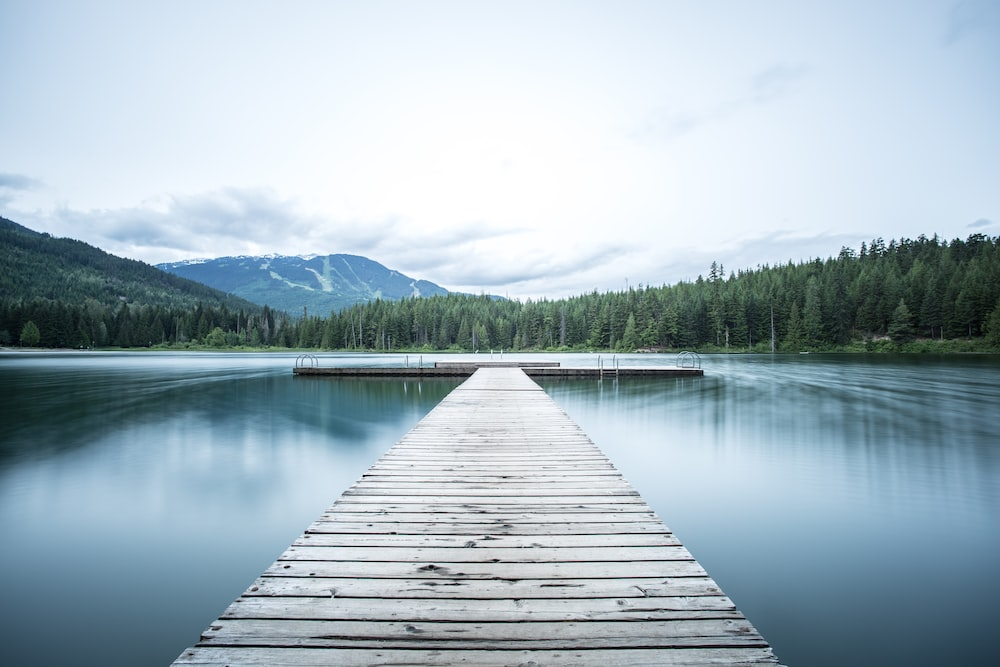

In [12]:
import requests
from PIL import Image

image_url = "https://llava-vl.github.io/static/images/view.jpg" # image_url also supports s3 uri, e.g. s3://demo/image/example.jpg
Image.open(requests.get(image_url, stream=True).raw)

In [22]:
text = "Describe the image?"
params = {
    "temperature": 0.2,
    "max_new_tokens": 512,
    "reset": "enable" # Use this parameter to start a new conversation
}

request_body = {"input_text": text, "input_image": image_url, "params": params}
smr_inference_stream = SmrInferenceStream(
    smr_client, model_name)
stream = smr_inference_stream.stream_inference(request_body)
for part in stream:
    print(part, end='')

The image captures a serene scene of a wooden dock extending into a calm, deep blue lake. The dock, appearing to be made of weathered wood, is the main focus of the image, leading the viewer's eye towards the tranquil water. The lake is surrounded by a lush expanse of green trees, creating a natural boundary that adds to the sense of tranquility. In the distance, a mountain can be seen, its peak partially obscured by the trees, adding a sense of depth and scale to the scene. Above, the sky is a clear blue, with a few clouds scattered across it, suggesting a calm and sunny day. The overall composition of the image suggests a peaceful and idyllic setting, perhaps a place for quiet reflection or a quiet escape from the hustle and bustle of everyday life.

Conversation history is: {"outputs": {"conv_history": [["USER", "<image>\nUSER: Describe the image?"], ["ASSISTANT", "The image captures a serene scene of a wooden dock extending into a calm, deep blue lake. The dock, appearing to be mad

In [23]:
text = "Do you like this palace?"
params = {
    "temperature": 0.2,
    "max_new_tokens": 512,
    # "reset": "enable" # Use this parameter to start a new conversation
}

# request_body = {"input_text": text, "input_image": None, "params": params}
request_body = {"input_text": text, "input_image": "", "params": params}
smr_inference_stream = SmrInferenceStream(
    smr_client, model_name)
stream = smr_inference_stream.stream_inference(request_body)
for part in stream:
    print(part, end='')

As an AI, I do not have personal preferences or feelings, but I can provide an analysis of the image. The image presents a picturesque scene with a wooden dock leading into a calm lake, surrounded by a lush green forest and a majestic mountain in the distance. The composition of the image is balanced, with the dock and the lake as the main focal points, and the natural elements providing a sense of depth and scale. The clear blue sky and the tranquil water add to the overall sense of peace and serenity. The image evokes a sense of calm and could be appreciated for its aesthetic qualities.

Conversation history is: {"outputs": {"conv_history": [["USER", "<image>\nUSER: Describe the image?"], ["ASSISTANT", "The image captures a serene scene of a wooden dock extending into a calm, deep blue lake. The dock, appearing to be made of weathered wood, is the main focus of the image, leading the viewer's eye towards the tranquil water. The lake is surrounded by a lush expanse of green trees, cre

#### Suppose you have an image in S3 like this one

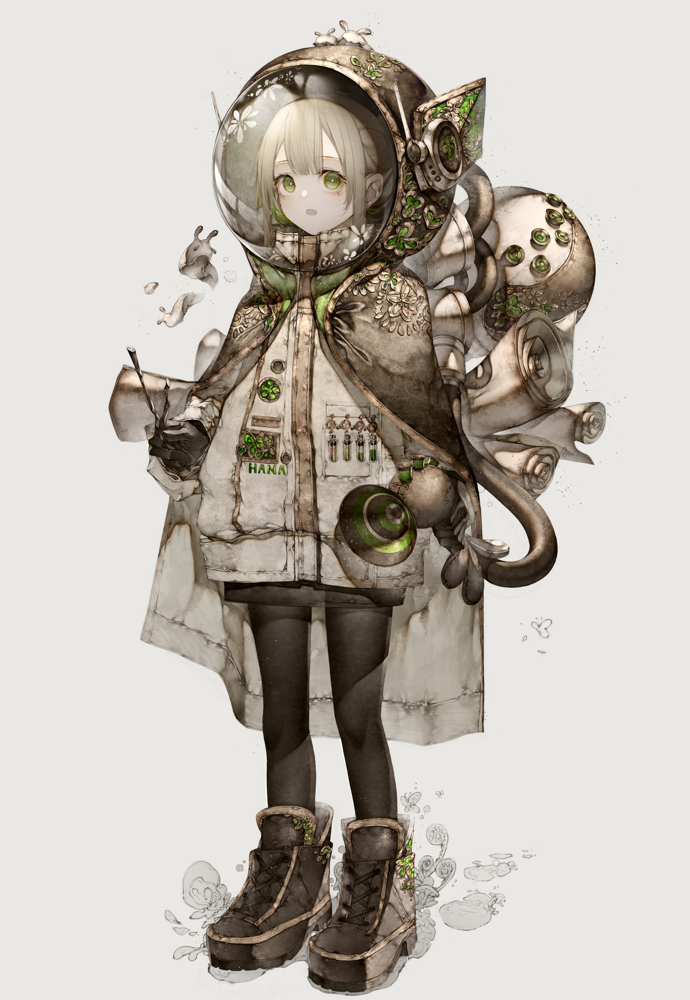

#### You can upload to your S3 bucket and use image S3 URI as "input_image"

In [20]:
text = "what's in the image?"
params = {
    "temperature": 0.2,
    "max_new_tokens": 512,
    "reset": "enable" # Use this parameter to start a new conversation
}

request_body = {"input_text": text, "input_image": "s3://sd-train-pic-examples/hitokomoru/hitokomoru_hito_komoru001.png", "params": params}
smr_inference_stream = SmrInferenceStream(
    smr_client, model_name)
stream = smr_inference_stream.stream_inference(request_body)
for part in stream:
    print(part, end='')

The image features an illustration of a character that appears to be a fusion of various elements. The character has a humanoid form with a large head and a small body, wearing a white coat with a green collar and a hat. The coat has a design that resembles a spacesuit, complete with what looks like a helmet and a visor. The character is also wearing black boots and has a pair of green gloves.

The character is surrounded by a variety of objects that seem to be floating around them, including what looks like a green plant, a small creature that could be a fish or a bug, and several other items that are not clearly defined. The overall style of the image is detailed and artistic, with a blend of realistic and fantastical elements.

Conversation history is: {"outputs": {"conv_history": [["USER", "<image>\nUSER: what's in the image?"], ["ASSISTANT", "The image features an illustration of a character that appears to be a fusion of various elements. The character has a humanoid form with a 